# Working with MEG dataset
MEG dataset from THINGS initiative: https://openneuro.org/datasets/ds004212/versions/2.0.1
### Training data partition
The data is .fif file which needs to be converted into a rather easy to use .npy array.
We will use mne library for this: https://mne.tools/dev/index.html 


In [1]:
import numpy as np
import mne, os
import matplotlib.pyplot as plt

In [2]:
file_path = 'preprocessed_P1-epo.fif'
def load_epochs(file_path,all_epochs = []):
    epochs = mne.read_epochs(file_path, preload=False)
    return epochs
epochs = load_epochs(file_path)

Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed_P1-epo.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed_P1-epo-1.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed_P1-epo-2.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Reading /home/asuryawanshi/Documents/THINGS/MEG/preprocessed_P1-epo-3.fif ...
    Found the data of interest:
        t =    -100.00 ...    1300.00 ms
        0 CTF compensation matrices available
Adding metadata with 18 columns
27048 matching events found
No baseline correction applied
0 projection items activated


We collected extensively sampled object representations using magnetoencephalography (MEG). To this end, we drew on the THINGS database (Hebart et al., 2019), a richly-annotated database of 1,854 object concepts representative of the American English language which contains 26,107 manually-curated naturalistic object images.

In [3]:
def setup_paths(meg_dir, session):
    run_paths,event_paths = [],[]
    for file in os.listdir(f'{meg_dir}/ses-{str(session).zfill(2)}/meg/'):
        if file.endswith(".ds") and file.startswith("sub"):
            run_paths.append(os.path.join(f'{meg_dir}/ses-{str(session).zfill(2)}/meg/', file))
        if file.endswith("events.tsv") and file.startswith("sub"):
            event_paths.append(os.path.join(f'{meg_dir}/ses-{str(session).zfill(2)}/meg/', file))
    run_paths.sort()
    event_paths.sort()

    return run_paths, event_paths 

In [4]:
epochs.info, epochs.get_data().shape

Loading data for 27048 events and 281 original time points ...


(<Info | 15 non-empty values
  bads: []
  ch_names: MLC11-1609, MLC12-1609, MLC13-1609, MLC14-1609, MLC15-1609, ...
  chs: 271 Magnetometers
  ctf_head_t: CTF/4D/KIT head -> head transform
  custom_ref_applied: False
  dev_ctf_t: MEG device -> CTF/4D/KIT head transform
  dev_head_t: MEG device -> head transform
  dig: 3 items (3 Cardinal)
  experimenter: hebart
  file_id: 4 items (dict)
  highpass: 0.1 Hz
  hpi_results: 1 item (list)
  lowpass: 40.0 Hz
  meas_date: 2019-06-13 12:13:00 UTC
  meas_id: 4 items (dict)
  nchan: 271
  projs: []
  sfreq: 200.0 Hz
 >,
 (27048, 271, 281))

In [5]:
epochs

<EpochsFIF | 27048 events (all good), -0.1 – 1.3 s (baseline off), ~234 kB, data not loaded, with metadata,
 '341': 1
 '483': 1
 '805': 1
 '1014': 1
 '1042': 1
 '1329': 1
 '1704': 1
 '1794': 12
 '1807': 1
 '1835': 1
 and 22439 more events ...>

In [20]:
np_epochs = np.array(epochs.get_data()).transpose(0,2,1)
np_epochs.shape

Loading data for 27048 events and 281 original time points ...


(27048, 281, 271)

27084 events, 281 time points, 271 channels

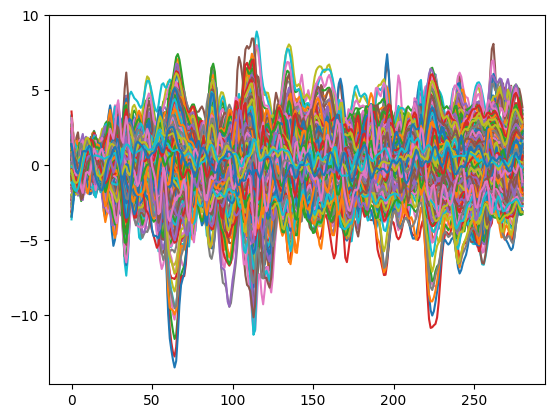

In [21]:
plt.plot(np_epochs[0,:,:])
plt.show()

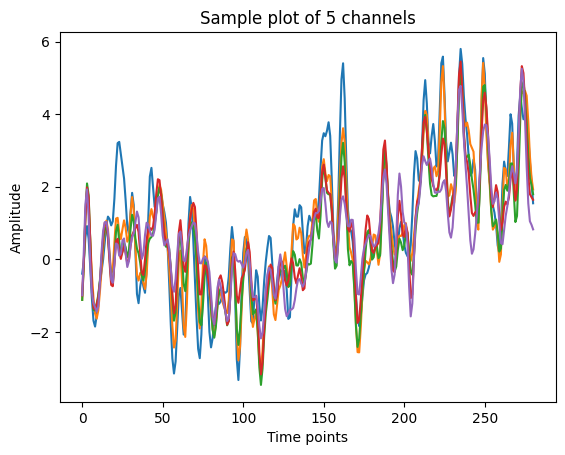

In [24]:
# sample plot of 5 channels.
plt.figure()
plt.plot(np_epochs[1,:,:5]) # requires reshaping to plot
plt.xlabel('Time points')
plt.ylabel('Amplitude')
plt.title('Sample plot of 5 channels')  
plt.show()

In [15]:
NOS_IMAGES = np_epochs.shape[0]
NOS_CHANNELS = np_epochs.shape[1]
NOS_TIME_POINTS = np_epochs.shape[2]
NOS_IMAGES, NOS_CHANNELS, NOS_TIME_POINTS   

(27048, 271, 281)

In [ ]:
plt.figure()
plt.plot(np_epochs[:,3,:].reshape())
plt.title('MEG channel 3 averaged over epochs')
plt.xlabel('Time points')
plt.ylabel('Amplitude')
plt.show()      

In [6]:
training_ave_over_reps = np.mean(training_1['preprocessed_eeg_data'],axis = 1)
X = training_ave_over_reps.reshape(NOS_IMAGES, NOS_CHANNELS*NOS_TIME_POINTS)
X += abs(X.min())*np.ones_like(X)
X.min(), X.shape

(0.0, (16540, 1700))

In [7]:
def compute_evar_all(V: np.ndarray, W: np.ndarray, H: np.ndarray):
    V_hat = np.dot(W, H)
    rss = np.sum(np.asarray(V_hat - V)**2)
    evar_all = 1. - rss / (V*V).sum()
    return evar_all

def compute_evar_indiv(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int):
    V_hat_d = np.outer(W[:, d], H[d, :])
    rss = np.sum(np.asarray(V_hat_d - V)**2)
    evar_indiv = 1. - rss / (V*V).sum()
    return evar_indiv

def compute_evar_unique(V: np.ndarray, W: np.ndarray, H: np.ndarray, d: int, evar_all: float):
    V_hat_wo_d = np.dot(W[:, np.arange(W.shape[1]) != d], H[np.arange(H.shape[0]) != d, :])
    rss = np.sum(np.asarray(V_hat_wo_d - V)**2)
    evar_rest = 1. - rss / (V*V).sum()
    evar_unique = evar_all - evar_rest
    return evar_unique

In [8]:
def fit_bnmf(V: np.ndarray, k: int):
    bnmf = nimfa.Bd(V, seed='random_c', rank=k, max_iter=500, min_residuals=1e-4, alpha=np.zeros((V.shape[0], k)),
                        beta=np.zeros((k, V.shape[1])), theta=.0, k=.0, sigma=1., skip=100, stride=1,
                        n_w=np.zeros((k, 1)), n_h=np.zeros((k, 1)), n_run=1, n_sigma=False)
    bnmf_fit = bnmf()
    W = bnmf_fit.basis()
    H = bnmf_fit.coef()
    return np.array(W), np.array(H)

In [9]:
# main_directory = 'training_images/'
# images_original_array = []
# subfolder_names = []
# i = 0
# for subfolder in os.listdir(main_directory):
#     subfolder_path = os.path.join(main_directory, subfolder)
#     if os.path.isdir(subfolder_path):
#         subfolder_names.append(subfolder)

# # sort subfolder names according initial number
# subfolder_names = sorted(subfolder_names, key=lambda x: int(x.split('_')[0]))
# for subfolder in subfolder_names:
#     subfolder_path = os.path.join(main_directory, subfolder)
#     image_names = []
#     for image in os.listdir(subfolder_path):
#         if image.endswith('.jpg'):
#             image_names.append(image)
#     image_names = sorted(image_names, key=lambda x: (x.split('.')[0].split('_')[-1]))
#     for image in image_names:
#         image_path = os.path.join(subfolder_path, image)
#         img = mpimg.imread(image_path)
#         images_original_array.append(img)
#         # i += 1

In [10]:
# len(images_original_array)

In [11]:
main_directory = 'training_images/'

# Dictionary to store images from each subfolder
images_dict = {}

# Iterate over all subfolders in the main directory
for subfolder in os.listdir(main_directory):
    subfolder_path = os.path.join(main_directory, subfolder)
    if os.path.isdir(subfolder_path):
        # List to store images from the current subfolder
        images = []
        # Get all filenames in the subfolder and sort them
        filenames = sorted([f for f in os.listdir(subfolder_path) if f.endswith('.jpg')])
        # Iterate over sorted filenames
        for filename in filenames:
            # Read the image
            img = mpimg.imread(os.path.join(subfolder_path, filename))
            # Append the image to the list
            images.append(img)
        # Store the list of images in the dictionary
        images_dict[subfolder] = images
sorted_keys = sorted(images_dict.keys(), key=lambda x: int(x.split('_')[0]))

# maximum number of images in any subfolder
max_images = 10 
# Initialize an array to store the images
# Assuming all images have the same shape, use the shape of the first image
first_image_shape = images_dict['00001_aardvark'][0].shape  
image_array = np.zeros((len(sorted_keys), max_images, *first_image_shape))

# Populate the array with images
for i, key in enumerate(sorted_keys):
    images = images_dict[key]
    for j, img in enumerate(images):
        image_array[i, j] = img
image_array = image_array.reshape(-1, *first_image_shape)/255.0
image_array.shape

(16540, 500, 500, 3)

In [12]:
# for num_components in range(1, 20, 5):
#     W, H = fit_bnmf(X, num_components)
#     X_pred = np.dot(W, H)
#     tqdm.write(f"Num components:{num_components} Sum(Abs()) = {np.mean(np.abs((X - X_pred)))}")

In [13]:
# check if W, H exists in folder else compute them
n_components = 10 # 3 mins for 30 components 
BAYESIAN = 0

In [14]:
# check if W, H exists in folder load them
if os.path.isfile(f'W_{n_components}.npy'):
    if os.path.isfile(f'H_{n_components}.npy'):
        W = np.load(f'W_{n_components}.npy')
        H = np.load(f'H_{n_components}.npy')
else:
    if BAYESIAN:
        W, H = fit_bnmf(X, n_components)
        X_pred = np.dot(W, H)
    else:
        model = NMF(n_components=n_components)
        W = model.fit_transform(X)
        H = model.components_
        X_pred = np.dot(W, H)
    np.save(f'W_{n_components}.npy', W)
    np.save(f'H_{n_components}.npy', H)
print(W.shape, H.shape) 


(16540, 10) (10, 1700)


In [15]:
componenet_vs_img = np.zeros((n_components, 5))
# W is the coefficients matrix, H is the basis matrix
for i in range(n_components):
    print(f"Images which load best on component {i} are {np.argsort(W[:,i])[-5:]}") 

Images which load best on component 0 are [ 2018  8070  1465 12122  1734]
Images which load best on component 1 are [ 5963  7429 15660 16343  5316]
Images which load best on component 2 are [ 8814  2136   734 15437  1465]
Images which load best on component 3 are [ 8380  7429 15437  5316  5963]
Images which load best on component 4 are [  734  9395 10532 16343  5972]
Images which load best on component 5 are [ 9965  1734 16267  1465 12387]
Images which load best on component 6 are [16267  2136 15659  5465  1465]
Images which load best on component 7 are [ 8253  4366  5501 15125  6577]
Images which load best on component 8 are [10090   300 13522 11667  9781]
Images which load best on component 9 are [ 5025 16435  1105 13615  7836]


In [16]:
# indices of images which load on best component i
image_array_sorted = np.zeros((n_components, NOS_IMAGES))
for component in range(n_components):
    image_array_sorted[component, :] = np.argsort(W[:,component])
image_array_sorted[0, -2]

12122.0

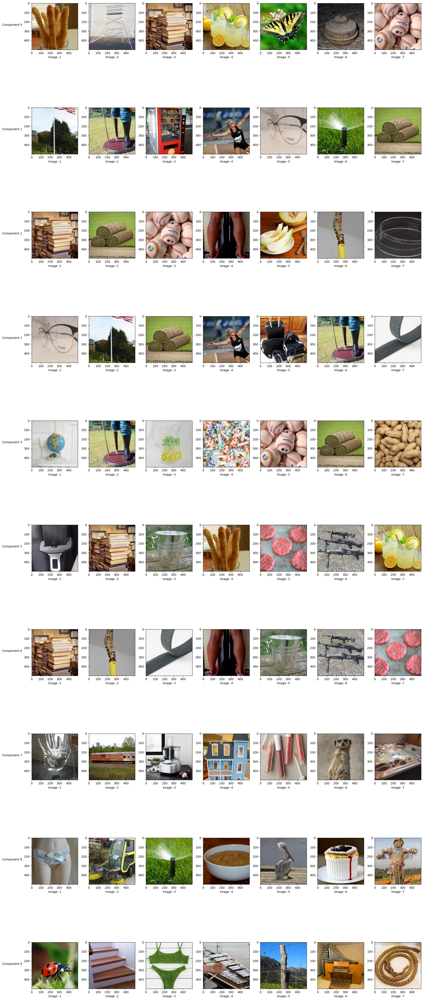

In [17]:
# subplot top images for all components
images_to_plot = 7
fig, ax = plt.subplots(n_components, images_to_plot, figsize=(20, 50))

for i in range(n_components):
    for j in range(images_to_plot):
        ax[i, j].imshow(image_array[int(image_array_sorted[i, -j-1])])   # -ve sign to get the last images as argsort makes ascending order
        # ax[i, j].axis('off')
        # Set the x-axis label as the image number
        ax[i, j].set_xlabel(f'Image {-j-1 }')
    # Set the y-axis label as the component number
    ax[i, 0].set_ylabel(f'Component {i }', rotation=0, labelpad=40)

plt.tight_layout()
plt.show()

In [18]:
# BAYESIAN = 1
# if BAYESIAN:
#     W, H = fit_bnmf(X, 10)
#     X_pred = np.dot(W, H)
# else:
#     model = NMF(n_components=n_components)
#     W = model.fit_transform(X)
#     H = model.components_
#     X_pred = np.dot(W, H)

In [19]:
# W.shape, H.shape # images x componentes, components x time*channels
# # save W, H 
# np.save(f"W_{n_components}.npy", W)
# np.save(f"H_{n_components}.npy", H)

In [20]:
pred_eeg = X_pred.reshape(NOS_IMAGES, NOS_CHANNELS, NOS_TIME_POINTS) # shape: imgx channels x times

NameError: name 'X_pred' is not defined

In [45]:
# plot any EEG line
correlation_matrix = np.zeros((NOS_IMAGES, NOS_CHANNELS))
for img in tqdm(range(NOS_IMAGES)):
    for channel in range(NOS_CHANNELS):
        # img = 1
        # channel = 1
        # plt.subplots(1,2, figsize=(10,5))
        # plt.subplot(1,2,1)
        # plt.plot(training_ave_over_reps[img_no,channel,:])
        # plt.subplot(1,2,2)    
        # plt.plot(pred_eeg[img_no,channel,:])
        # plt.show()
        correlation_matrix[img, channel] = np.corrcoef(training_ave_over_reps[img,channel,:],pred_eeg[img,channel,:])[0,1]
        # print(np.corrcoef(training_ave_over_reps[img,channel,:],pred_eeg[img,channel,:])[0,1])

 54%|█████▎    | 8850/16540 [00:06<00:05, 1405.69it/s]

100%|██████████| 16540/16540 [00:11<00:00, 1386.77it/s]


In [46]:
np.max(correlation_matrix, axis= 1)

array([0.93848222, 0.85457968, 0.80583198, ..., 0.94595192, 0.81508924,
       0.91840587])

In [47]:
img = 2
channel = 1
plt.(f"Image:{img} & channel: {channel}")
plt.subplots(1,2, figsize=(10,5))
plt.subplot(1,2,1)
plt.title("Actual EEG")
plt.plot(training_ave_over_reps[img,channel,:])
plt.subplot(1,2,2)
plt.title("Predicted EEG")
plt.plot(pred_eeg[img,channel,:])
plt.show()

SyntaxError: invalid syntax (4144906278.py, line 3)

In [13]:
# num_components = 40
# W, H = fit_bnmf(X, num_components)
# X_pred = np.dot(W, H)
# tqdm.write(f"Num components:{num_components} Sum(Abs()) = {np.mean(np.abs((X - X_pred)))}")

Num components:40 Sum(Abs()) = 0.21963746575438597


In [84]:
# num_components = 100
# W, H = fit_bnmf(X, num_components)
# X_pred = np.dot(W, H)
# tqdm.write(f"Num components:{num_components} Sum(Abs()) = {np.mean(np.abs((X - X_pred)))}")

Num components:100 Sum(Abs()) = 0.1772618019108304


In [85]:
# num_components = 200
# W, H = fit_bnmf(X, num_components)
# X_pred = np.dot(W, H)
# tqdm.write(f"Num components:{num_components} Sum(Abs()) = {np.mean(np.abs((X - X_pred)))}")

Num components:200 Sum(Abs()) = 0.13860608076293063


In [18]:
compute_evar_all(X, W, H)

0.9999886304678721

In [14]:
evar_indiv = np.zeros(40)
for i in range(40):
    print(f"{i}: {compute_evar_indiv(X, W, H, i)}")
    evar_indiv[i] = compute_evar_indiv(X, W, H, i)
evar_indiv

0: 0.00426479877741881
1: 0.0031071150533202863
2: 0.0025423116233695975
3: 0.002199912596984821
4: 0.0023274031236586445
5: 0.00197219926355674
6: 0.002104634913495218
7: 0.0020812536741702248
8: 0.0016481617085328804
9: 0.002029022680812842
10: 0.0018046461648766332
11: 0.0017150436493044152
12: 0.001734299244766646
13: 0.001600746471535408
14: 0.0012049463505858782
15: 0.0015166982393016726
16: 0.0012287319282273668
17: 0.0013176785157233972
18: 0.0013437736711293669
19: 0.0010911411307338303
20: 0.001361993068182521
21: 0.0011720560822124915
22: 0.0011784308985886005
23: 0.001041641748363964
24: 0.0012213853827370835
25: 0.0009252306498644947
26: 0.0010751877463146542
27: 0.0011733472517819754
28: 0.0008250029259865288
29: 0.0010587087277672547
30: 0.0010421168655166957
31: 0.0008901841606452354
32: 0.001093635702438589
33: 0.000995386810380472
34: 0.0011326058868453837
35: 0.001133343370142259
36: 0.00107972305807158
37: 0.0005202094345106989
38: 0.0005496807501932377
39: 0.999079

IndexError: index 40 is out of bounds for axis 1 with size 40

In [14]:
for i in range(40):
    print(f"{i}: {compute_evar_unique(X, W, H, i)}")

TypeError: compute_evar_unique() missing 1 required positional argument: 'evar_all'

In [87]:
num_components = 500
W, H = fit_bnmf(X, num_components)
X_pred = np.dot(W, H)
tqdm.write(f"Num components:{num_components} Sum(Abs()) = {np.mean(np.abs((X - X_pred)))}")

KeyboardInterrupt: 